### Multimodal Image Classification Using Traditional Feature Extraction

In [ ]:
import cv2
import os
import numpy as np
import pickle

import json
import re
import pandas as pd
import numpy as np
import pickle
from collections import Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import gensim.downloader as api

import tensorflow as tf
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split # You used unique image paths, which is better
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import torch
from sklearn.metrics import multilabel_confusion_matrix

# import nltk
# nltk.download('punkt')

2025-09-10 14:27:08.321955: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-10 14:27:10.171220: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757494630.521223    5156 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757494630.620277    5156 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1757494632.455139    5156 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
if torch.cuda.is_available():
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    print("Using CPU")


Using GPU: NVIDIA GeForce RTX 4080 SUPER


Objective is to extract traditional features from both image and text modalities, fuse them, and train a classification model. Then compare the performance of a multimodal model against unimodal (image-only and text-only) counterparts to understand the benefits of combining information sources. The MS COCO 2017 Validation Set is utilized here.

### Image Feature Extraction using Canny Edge Detection

In [ ]:
img_dir = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/val2017'
captions_json_path = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/captions_val2017.json'
instances_json_path = '/home/BTECH_7TH_SEM/Desktop/MML/MS-COCO/annotations_trainval2017/annotations/instances_val2017.json'

def extract_canny_features(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load the image in grayscale
    img = cv2.resize(img, (64, 64))
    edges = cv2.Canny(img, 100, 200)  #Canny produces an edge map, which is a 2D array so flatten it.
    return edges.flatten()  #64*64 feature size
#edges = cv2.Canny(img, 100, 200)  low an dhigh threshold values
canny_features = {}
for img_filename in os.listdir(img_dir):
    img_path = os.path.join(img_dir, img_filename)
    features = extract_canny_features(img_path)
    if features is not None:
        canny_features[img_path] = features

with open('canny_img_features.pkl', 'wb') as fp:
    pickle.dump(canny_features, fp)
print(f"Canny features extracted for {len(canny_features)} images.")

if canny_features:
    first_key = list(canny_features.keys())[0]
    print(f"Canny feature vector shape: {canny_features[first_key].shape}")

Canny features extracted for 5000 images.
Canny feature vector shape: (4096,)


The Canny edge detection algorithm is a multi-stage process used to detect a wide range of edges in images.
Each image was loaded in grayscale.
The cv2.Canny function was applied with low_threshold=100 and high_threshold=200.
The resulting binary edge map (a 2D array indicating edge presence) was then resized to a fixed dimension of 64x64 pixels.
Finally, this 64x64 matrix was flattened into a 1D feature vector of 4096 dimensions (64 * 64 = 4096).

### Caption feature extraction using Word2Vec

In [ ]:
with open(captions_json_path, 'r') as f:
    captions_data = json.load(f)

image_id_to_filename = {image['id']: image['file_name'] for image in captions_data['images']}
coco_data_dict = {} # To store image_path -> list of captions

for annotation in captions_data['annotations']:
    image_id = annotation['image_id']
    caption = annotation['caption']
    if image_id in image_id_to_filename:
        image_filename = image_id_to_filename[image_id]
        img_path = os.path.join(img_dir, image_filename)
        if img_path not in coco_data_dict:
            coco_data_dict[img_path] = []
        coco_data_dict[img_path].append(caption)

def preprocess_text(text):
    text = text.lower() # Lowercasing
    text = re.sub(r'[^\w\s]', '', text) # Remove punctuation
    tokens = word_tokenize(text) # Tokenization
    tokens = [word for word in tokens if word.isalpha()] # Remove non-alphabetic
    return tokens

# Function to get caption embedding by averaging word vectors
def get_caption_embedding(caption_tokens, wv_model, embedding_dim):
    embeddings = []
    for word in caption_tokens:
        if word in wv_model:
            embeddings.append(wv_model[word])
    if embeddings:
        return np.mean(embeddings, axis=0) # Average the word vectors
    else:
        return np.zeros(embedding_dim) # Return a zero vector if no words are found in vocabulary

In [ ]:
wv_model = api.load('word2vec-google-news-300')  #'word2vec-google-news-300' has 300-dimensional vectors, trained on Google News [3]
WORD2VEC_DIM = wv_model.vector_size # Should be 300

caption_features = {}
for image_path, captions in coco_data_dict.items():
    features_for_image = []
    for caption in captions:
        tokens = preprocess_text(caption)
        embedding = get_caption_embedding(tokens, wv_model, WORD2VEC_DIM)
        features_for_image.append(embedding)
    caption_features[image_path] = features_for_image

with open("word2vec_caption_features.pkl", "wb") as fp:
    pickle.dump(caption_features, fp)


get_caption_embedding returns one embedding vector for the whole caption. That embedding has 300 dimensions (since word2vec-google-news-300).

1 caption → 1 vector of size 300

Word2Vec is a neural network-based technique that learns dense, fixed-size vector representations (embeddings) for words. Words with similar meanings are mapped to vectors that are close to each other in the embedding space.

In [ ]:
random_image_path = random.choice(list(coco_data_dict.keys()))
random_captions = coco_data_dict[random_image_path]
random_features = caption_features[random_image_path]

for caption, feature in zip(random_captions, random_features):
    print(f"\nCaption: \"{caption}\"")
    print(f"  Feature : {feature}")
    print(f"  Feature Shape: {feature.shape}")


Caption: "A laptop computer sitting on a truck table."
  Feature : [ 0.06062825 -0.06595866  0.03577678  0.19356282  0.01999919 -0.0119222
 -0.01568604 -0.07267252  0.21443684  0.08850098  0.05076091 -0.06797282
  0.04518636 -0.05100505 -0.04707845  0.04707845 -0.02693685  0.05664062
  0.09134928 -0.08532715  0.0061849   0.02827962 -0.1533165   0.01279704
  0.13382976 -0.02784475 -0.04003906  0.12723796  0.06070964 -0.06192128
 -0.07890829 -0.01450221 -0.09261576  0.06781006 -0.06115723 -0.17407227
 -0.03995768  0.09390259 -0.04911296 -0.05192057 -0.1274821   0.03027344
  0.12715657  0.01906331 -0.00063896  0.01658122 -0.08503977  0.07307943
  0.06233724 -0.0204277  -0.20855713  0.04589335  0.071757   -0.09571838
 -0.07735697  0.05957031  0.05612819  0.02118937  0.09356689  0.04156494
 -0.05598958  0.02583822 -0.21305339  0.06550089 -0.01173909  0.01479848
 -0.11238607  0.07761129 -0.05712891 -0.00146484  0.14119466 -0.04949443
  0.13142903  0.06510416 -0.16168213 -0.00594076  0.02757

### Feature Concatenation  (Early Fusion)

For each (image, caption) pair, the 4096-dimensional Canny edge feature vector and the 300-dimensional Word2Vec caption feature vector were simply concatenated (joined end-to-end). This resulted in a combined multimodal feature vector of 4396 dimensions for each sample. It creates a unified feature space, allowing the subsequent classification model to learn complex interactions between the image and text modalities directly from the combined representation.

In [ ]:
image_features_path = 'canny_img_features.pkl'
caption_features_path = 'word2vec_caption_features.pkl'

with open(image_features_path, 'rb') as f:
    image_features = pickle.load(f)

with open(caption_features_path, 'rb') as f:
    caption_features = pickle.load(f)

with open(captions_json_path, 'r') as f:
    captions_data = json.load(f)

for annotation in captions_data['annotations']:
    image_id = annotation['image_id']
    caption = annotation['caption']
    if image_id in image_id_to_filename:
        image_filename = image_id_to_filename[image_id]
        img_path = os.path.join(img_dir, image_filename)
        if img_path not in coco_data_dict:
            coco_data_dict[img_path] = []
        coco_data_dict[img_path].append(caption)

with open(instances_json_path, 'r') as f:
    instances_data = json.load(f)
category_id_to_name = {cat['id']: cat['name'] for cat in instances_data['categories']}
image_id_to_filename_inst = {img['id']: img['file_name'] for img in instances_data['images']}
image_path_to_labels = {}
for annotation in instances_data['annotations']:
    image_id = annotation['image_id']
    category_id = annotation['category_id']
    if image_id in image_id_to_filename_inst:
        img_path = os.path.join(img_dir, image_id_to_filename_inst[image_id])
        label = category_id_to_name[category_id]
        if img_path not in image_path_to_labels:
            image_path_to_labels[img_path] = set()
        image_path_to_labels[img_path].add(label)

processed_data = []
CANNY_FEATURE_DIM = 64 * 64
WORD2VEC_FEATURE_DIM = 300

for img_path, text_caps in coco_data_dict.items():
    img_feat = image_features.get(img_path)
    feat_caps = caption_features.get(img_path)
    labels_set = image_path_to_labels.get(img_path)
    all_labels_str = ",".join(sorted(list(labels_set))) if labels_set else "" # Handles empty labels, converts to empty string

    for text_caption, caption_feat_vector in zip(text_caps, feat_caps):
        combined_features = np.concatenate([img_feat, caption_feat_vector])
        row = [img_path, text_caption] + combined_features.tolist() + [all_labels_str]
        processed_data.append(row)
print(f"Generated {len(processed_data)} rows.")

img_feat_cols = [f'img_feat_{i+1}' for i in range(CANNY_FEATURE_DIM)]
cap_feat_cols = [f'cap_feat_{i+1}' for i in range(WORD2VEC_FEATURE_DIM)]
column_names = ['image_path', 'caption_text'] + img_feat_cols + cap_feat_cols + ['all_labels']

df = pd.DataFrame(processed_data, columns=column_names)
df.to_csv("coco_multilabel_dataset_word2vec_canny.csv", index=False)
print(f"Saved the dataset to coco_multilabel_dataset_word2vec_canny.csv")

Generated 25014 rows.
Saved the dataset to coco_multilabel_dataset_word2vec_canny.csv


Each row in the CSV represents a unique (image, caption) pair. The columns are structured as follows:
image_path: String, the file path to the image.
caption_text: String, the original ground truth caption.
img_feat_1 to img_feat_4096: Float, the 4096 dimensions of the flattened Canny edge feature vector.
cap_feat_1 to cap_feat_300: Float, the 300 dimensions of the Word2Vec feature vector for the corresponding caption.
all_labels: String, comma-separated ground truth object labels for the image (e.g., "person,car,traffic light"). Empty string if no labels are present for that image.

### Model Building

Splitting based on images, not based on sample (row) to avoid information leakage.

There are 5 rows corresponding to one image. If all 5 samples went in different split like in train, val and test set then that will alwys correctly predict label as it would have been seen the image in train set. So I am splitting the dataset based on unique images (5000 images).

In [ ]:
# --- Configuration ---
CSV_PATH = "coco_multilabel_dataset_word2vec_canny.csv"
MODEL_SAVE_PATH_MULTIMODAL = "multimodal_classifier_canny_word2vec.h5"
MODEL_SAVE_PATH_IMAGE_ONLY = "image_only_classifier_canny.h5"
MODEL_SAVE_PATH_CAPTION_ONLY = "caption_only_classifier_word2vec.h5"

BATCH_SIZE = 64
EPOCHS = 30
TEST_SPLIT_SIZE = 0.20
VAL_SPLIT_SIZE = 0.10

CANNY_FEATURE_DIM = 64 * 64
WORD2VEC_FEATURE_DIM = 300

image_feature_cols = [f'img_feat_{i+1}' for i in range(CANNY_FEATURE_DIM)]
caption_feature_cols = [f'cap_feat_{i+1}' for i in range(WORD2VEC_FEATURE_DIM)]

df_full = pd.read_csv(CSV_PATH)
df_full['all_labels'] = df_full['all_labels'].fillna('')

df_labeled = df_full[df_full['all_labels'] != ''].copy()
df_unlabeled = df_full[df_full['all_labels'] == ''].copy() # These won't be used for training/validation/test
df_unlabeled.to_csv("df_unlabeled.csv", index=False)
print(f"Found {len(df_labeled)} labeled samples for training/testing.")
print(f"Found {len(df_unlabeled)} unlabeled samples to predict on later (not used in training/evaluation).")

df = df_labeled

# Multi-Label Binarization)
labels = [set(str(s).split(',')) for s in df['all_labels']]
mlb = MultiLabelBinarizer()
y = mlb.fit_transform(labels)
print("shape of y features",y.shape)
output_dim = y.shape[1] # Number of output classes
print(f"Found {len(mlb.classes_)} unique classes.")
print(mlb.classes_)

Found 24774 labeled samples for training/testing.
Found 240 unlabeled samples to predict on later (not used in training/evaluation).
shape of y features (24774, 80)
Found 80 unique classes.
['airplane' 'apple' 'backpack' 'banana' 'baseball bat' 'baseball glove'
 'bear' 'bed' 'bench' 'bicycle' 'bird' 'boat' 'book' 'bottle' 'bowl'
 'broccoli' 'bus' 'cake' 'car' 'carrot' 'cat' 'cell phone' 'chair' 'clock'
 'couch' 'cow' 'cup' 'dining table' 'dog' 'donut' 'elephant'
 'fire hydrant' 'fork' 'frisbee' 'giraffe' 'hair drier' 'handbag' 'horse'
 'hot dog' 'keyboard' 'kite' 'knife' 'laptop' 'microwave' 'motorcycle'
 'mouse' 'orange' 'oven' 'parking meter' 'person' 'pizza' 'potted plant'
 'refrigerator' 'remote' 'sandwich' 'scissors' 'sheep' 'sink' 'skateboard'
 'skis' 'snowboard' 'spoon' 'sports ball' 'stop sign' 'suitcase'
 'surfboard' 'teddy bear' 'tennis racket' 'tie' 'toaster' 'toilet'
 'toothbrush' 'traffic light' 'train' 'truck' 'tv' 'umbrella' 'vase'
 'wine glass' 'zebra']


In [ ]:
all_individual_labels = []
for labels_str in df['all_labels']:
    # Split the string by comma and add to the list
    all_individual_labels.extend(labels_str.split(','))

# Count the frequency of each label
label_counts = Counter(all_individual_labels)

# Print the distribution
print("\n--- Category-wise Distribution of Samples ---")
for label, count in label_counts.most_common():
    print(f"'{label}': {count} occurrences")




--- Category-wise Distribution of Samples ---
'person': 13471 occurrences
'chair': 2901 occurrences
'car': 2677 occurrences
'dining table': 2506 occurrences
'cup': 1950 occurrences
'bottle': 1895 occurrences
'bowl': 1570 occurrences
'handbag': 1460 occurrences
'truck': 1250 occurrences
'bench': 1175 occurrences
'book': 1150 occurrences
'backpack': 1140 occurrences
'cell phone': 1070 occurrences
'tv': 1035 occurrences
'clock': 1021 occurrences
'couch': 977 occurrences
'traffic light': 955 occurrences
'bus': 945 occurrences
'sink': 936 occurrences
'cat': 920 occurrences
'laptop': 915 occurrences
'knife': 906 occurrences
'dog': 885 occurrences
'umbrella': 870 occurrences
'potted plant': 860 occurrences
'sports ball': 845 occurrences
'tennis racket': 835 occurrences
'motorcycle': 795 occurrences
'train': 787 occurrences
'fork': 775 occurrences
'spoon': 765 occurrences
'pizza': 765 occurrences
'toilet': 746 occurrences
'bed': 745 occurrences
'bicycle': 745 occurrences
'surfboard': 745 occu

In [ ]:

# --- Data Splitting based on unique images ---
unique_image_paths = df['image_path'].unique()
np.random.seed(42) # for reproducibility
np.random.shuffle(unique_image_paths)

num_total_images = len(unique_image_paths)
test_split_idx = int(num_total_images * TEST_SPLIT_SIZE)
val_split_idx = int(num_total_images * (TEST_SPLIT_SIZE + VAL_SPLIT_SIZE))

test_paths = unique_image_paths[:test_split_idx]
val_paths = unique_image_paths[test_split_idx:val_split_idx]
train_paths = unique_image_paths[val_split_idx:]

print(f"\nUnique images in Train set: {len(train_paths)}")
print(f"Unique images in Validation set: {len(val_paths)}")
print(f"Unique images in Test set: {len(test_paths)}")

df_train = df[df['image_path'].isin(train_paths)]
df_val = df[df['image_path'].isin(val_paths)]
df_test = df[df['image_path'].isin(test_paths)]

y_train = mlb.transform([set(str(s).split(',')) for s in df_train['all_labels']])
y_val = mlb.transform([set(str(s).split(',')) for s in df_val['all_labels']])
y_test = mlb.transform([set(str(s).split(',')) for s in df_test['all_labels']])

print(f"\nTotal rows in Training set: {len(df_train)}")
print(f"Total rows in Validation set: {len(df_val)}")
print(f"Total rows in Test set: {len(df_test)}")

def build_and_train_model(X_train_data, y_train_data, X_val_data, y_val_data, input_dim, model_name):
    print(f"\n Building and Training {model_name} Model")
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(input_dim,)),
        tf.keras.layers.Dense(2048, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.Dense(output_dim, activation='sigmoid') # Sigmoid for multi-label classification
    ])

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    metrics = [
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc', multi_label=True),
        'binary_accuracy'
    ]
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=metrics)
    model.summary()

    history = model.fit(
        X_train_data, y_train_data,
        batch_size=BATCH_SIZE,
        epochs=EPOCHS,
        validation_data=(X_val_data, y_val_data),
        verbose=1
    )
    return model, history

def evaluate_and_report(model, X_test_data, y_test_data, mlib_classes, model_name, save_path):
    print(f"\n--- Evaluating {model_name} on Test Set ---")
    test_results = model.evaluate(X_test_data, y_test_data, verbose=0)
    print(f"Test Loss: {test_results[0]:.4f}")
    print(f"Test Precision: {test_results[1]:.4f}")
    print(f"Test Recall: {test_results[2]:.4f}")
    print(f"Test AUC: {test_results[3]:.4f}")
    print(f"Test Binary Accuracy: {test_results[4]:.4f}")

    y_pred_probs = model.predict(X_test_data)
    y_pred_binary = (y_pred_probs > 0.5).astype(int)

    report = classification_report(y_test_data, y_pred_binary, target_names=mlib_classes, zero_division=0)
    print("\nClassification Report:\n", report)

    conf_matrices = multilabel_confusion_matrix(y_test, y_pred_binary)
    print("Confusion Matrices for each class:\n")
    for idx, label in enumerate(mlb.classes_):
        tn, fp, fn, tp = conf_matrices[idx].ravel()
        custom_matrix = np.array([[tp, fn],
                              [fp, tn]])
        print(f"Class: {label}")
        print(f"  TP={tp}, FN={fn}, FP={fp}, TN={tn} ")

        print(f"  Confusion Matrix:\n{custom_matrix}\n")
    model.save(save_path)
    print(f"Model saved to {save_path}")
    return test_results[3] # Return AUC for comparison



Unique images in Train set: 3467
Unique images in Validation set: 495
Unique images in Test set: 990

Total rows in Training set: 17347
Total rows in Validation set: 2475
Total rows in Test set: 4952


In [ ]:
# Multimodal Model (Image + Caption)
X_train_multimodal = df_train[image_feature_cols + caption_feature_cols].values
X_val_multimodal = df_val[image_feature_cols + caption_feature_cols].values
X_test_multimodal = df_test[image_feature_cols + caption_feature_cols].values
input_dim_multimodal = X_train_multimodal.shape[1]

multimodal_model, _ = build_and_train_model(
    X_train_multimodal, y_train,
    X_val_multimodal, y_val,
    input_dim_multimodal, "Multimodal (Canny + Word2Vec)"
)
multimodal_accuracy = evaluate_and_report(
    multimodal_model, X_test_multimodal, y_test, mlb.classes_,
    "Multimodal (Canny + Word2Vec)", MODEL_SAVE_PATH_MULTIMODAL
)


 Building and Training Multimodal (Canny + Word2Vec) Model


I0000 00:00:1757494802.151127    5156 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13774 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4080 SUPER, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 2048)           │     9,005,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 80)             │        20,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,795,280 (45.00 MB)

 Trainable params: 11,787,600 (44.97 MB)

 Non-trainable params: 7,680 (30.00 KB)

Epoch 1/30


I0000 00:00:1757494809.054057    5655 service.cc:152] XLA service 0x715a44002b10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1757494809.054076    5655 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 SUPER, Compute Capability 8.9
2025-09-10 14:30:09.309921: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1757494809.765246    5655 cuda_dnn.cc:529] Loaded cuDNN version 91002
I0000 00:00:1757494813.622253    5655 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


272/272 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - auc: 0.5185 - binary_accuracy: 0.5123 - loss: 0.8929 - precision: 0.0381 - recall: 0.5102 - val_auc: 0.5197 - val_binary_accuracy: 0.5962 - val_loss: 0.6711 - val_precision: 0.0399 - val_recall: 0.4076
Epoch 2/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.5479 - binary_accuracy: 0.5589 - loss: 0.7755 - precision: 0.0422 - recall: 0.5117 - val_auc: 0.5263 - val_binary_accuracy: 0.7437 - val_loss: 0.5752 - val_precision: 0.0484 - val_recall: 0.3007
Epoch 3/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.5505 - binary_accuracy: 0.6791 - loss: 0.6152 - precision: 0.0481 - recall: 0.4160 - val_auc: 0.5335 - val_binary_accuracy: 0.9424 - val_loss: 0.4188 - val_precision: 0.1580 - val_recall: 0.1120
Epoch 4/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.5489 - binary_accuracy: 0.8520 - loss: 0.4278 - precision: 0.0690 - recall: 0.2454 - val_auc: 0.5288 - val_binary_accuracy: 0.9618 - val_loss: 0.2832 - val_precision: 0.5502 - val_


Classification Report:
                 precision    recall  f1-score   support

      airplane       1.00      0.11      0.19        95
         apple       0.00      0.00      0.00        75
      backpack       0.00      0.00      0.00       235
        banana       0.00      0.00      0.00       125
  baseball bat       0.00      0.00      0.00        85
baseball glove       0.00      0.00      0.00        95
          bear       0.00      0.00      0.00        35
           bed       1.00      0.03      0.06       150
         bench       0.00      0.00      0.00       210
       bicycle       0.00      0.00      0.00       120
          bird       0.00      0.00      0.00        90
          boat       0.00      0.00      0.00       115
          book       0.00      0.00      0.00       255
        bottle       0.00      0.00      0.00       390
          bowl       0.00      0.00      0.00       315
      broccoli       0.00      0.00      0.00        50
           bus       0

Poor Performance for Most Classes (Precision/Recall/F1-score of 0.00)
Macro avg: The low recall and F1-score confirm the model's struggle to identify actual objects.
The extremely low macro averages indicate that the model performs very poorly across the majority of individual classes.
The multimodal model is largely failing to identify most objects. It only reliably identifies 'person'.
High Binary Accuracy is Misleading
The low AUC of 0.5614 confirms that its ability to discriminate between the presence and absence of labels is only slightly better than random guessing

In [ ]:
# Unimodal Model (Image-only)
X_train_image = df_train[image_feature_cols].values
X_val_image = df_val[image_feature_cols].values
X_test_image = df_test[image_feature_cols].values
input_dim_image = X_train_image.shape[1]

image_only_model, _ = build_and_train_model(
    X_train_image, y_train,
    X_val_image, y_val,
    input_dim_image, "Unimodal (Canny Image Only)"
)
image_only_accuracy = evaluate_and_report(
    image_only_model, X_test_image, y_test, mlb.classes_,
    "Unimodal (Canny Image Only)", MODEL_SAVE_PATH_IMAGE_ONLY
)


 Building and Training Unimodal (Canny Image Only) Model


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5 (Dense)                 │ (None, 2048)           │     8,390,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 80)             │        20,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,180,880 (42.65 MB)

 Trainable params: 11,173,200 (42.62 MB)

 Non-trainable params: 7,680 (30.00 KB)

Epoch 1/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - auc: 0.5168 - binary_accuracy: 0.5123 - loss: 0.8945 - precision: 0.0384 - recall: 0.5156 - val_auc: 0.4945 - val_binary_accuracy: 0.5944 - val_loss: 0.6730 - val_precision: 0.0417 - val_recall: 0.4297
Epoch 2/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.5442 - binary_accuracy: 0.5543 - loss: 0.7805 - precision: 0.0421 - recall: 0.5166 - val_auc: 0.5002 - val_binary_accuracy: 0.7205 - val_loss: 0.5896 - val_precision: 0.0470 - val_recall: 0.3223
Epoch 3/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.5545 - binary_accuracy: 0.6693 - loss: 0.6227 - precision: 0.0479 - recall: 0.4284 - val_auc: 0.5114 - val_binary_accuracy: 0.9466 - val_loss: 0.4095 - val_precision: 0.2274 - val_recall: 0.1569
Epoch 4/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.5465 - binary_accuracy: 0.8426 - loss: 0.4326 - precision: 0.0670 - recall: 0.2570 - val_auc: 0.5221 - val_binary_accuracy: 0.9621 - val_loss: 0.2802 - val_precision: 0.5


Classification Report:
                 precision    recall  f1-score   support

      airplane       1.00      0.05      0.10        95
         apple       0.00      0.00      0.00        75
      backpack       0.00      0.00      0.00       235
        banana       0.00      0.00      0.00       125
  baseball bat       0.00      0.00      0.00        85
baseball glove       0.00      0.00      0.00        95
          bear       0.00      0.00      0.00        35
           bed       0.00      0.00      0.00       150
         bench       0.00      0.00      0.00       210
       bicycle       0.00      0.00      0.00       120
          bird       0.00      0.00      0.00        90
          boat       0.00      0.00      0.00       115
          book       0.25      0.04      0.07       255
        bottle       0.06      0.01      0.02       390
          bowl       1.00      0.02      0.03       315
      broccoli       0.00      0.00      0.00        50
           bus       1

Canny-only model also has 0.00 precision, recall, and f1-score for nearly all classes. Even poorer discriminatory power when relying solely on Canny features.
It only shows non-zero performance for 'person' (Precision 0.58, Recall 0.68, F1-score 0.63), 'airplane', 'bus', 'car', 'chair', 'clock', 'couch', 'dining table', 'sports ball', and 'tennis racket'. For 'airplane' and 'clock', it has high precision (1.00) but extremely low recall (0.05, 0.03), meaning it rarely predicted these, but when it did, it was usually right.

In [ ]:
# Unimodal Model (Caption-only)
X_train_caption = df_train[caption_feature_cols].values
X_val_caption = df_val[caption_feature_cols].values
X_test_caption = df_test[caption_feature_cols].values
input_dim_caption = X_train_caption.shape[1]

caption_only_model, _ = build_and_train_model(
    X_train_caption, y_train,
    X_val_caption, y_val,
    input_dim_caption, "Unimodal (Word2Vec Caption Only)"
)
caption_only_accuracy = evaluate_and_report(
    caption_only_model, X_test_caption, y_test, mlb.classes_,
    "Unimodal (Word2Vec Caption Only)", MODEL_SAVE_PATH_CAPTION_ONLY
)

# Compare Unimodal vs Multimodal Performance
print("\n--- Performance Comparison ---")
print(f"Multimodal (Canny + Word2Vec) Test Binary Accuracy: {multimodal_accuracy:.4f}")
print(f"Unimodal (Canny Image Only) Test Binary Accuracy: {image_only_accuracy:.4f}")
print(f"Unimodal (Word2Vec Caption Only) Test Binary Accuracy: {caption_only_accuracy:.4f}")


 Building and Training Unimodal (Word2Vec Caption Only) Model


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 2048)           │       616,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 80)             │        20,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,406,672 (13.00 MB)

 Trainable params: 3,398,992 (12.97 MB)

 Non-trainable params: 7,680 (30.00 KB)

Epoch 1/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - auc: 0.5793 - binary_accuracy: 0.5222 - loss: 0.8707 - precision: 0.0456 - recall: 0.6073 - val_auc: 0.6576 - val_binary_accuracy: 0.5932 - val_loss: 0.6569 - val_precision: 0.0488 - val_recall: 0.5130
Epoch 2/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - auc: 0.6396 - binary_accuracy: 0.5841 - loss: 0.7380 - precision: 0.0560 - recall: 0.6562 - val_auc: 0.7321 - val_binary_accuracy: 0.8406 - val_loss: 0.5717 - val_precision: 0.1244 - val_recall: 0.5151
Epoch 3/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - auc: 0.6506 - binary_accuracy: 0.7341 - loss: 0.5853 - precision: 0.0741 - recall: 0.5482 - val_auc: 0.7826 - val_binary_accuracy: 0.9558 - val_loss: 0.4262 - val_precision: 0.4221 - val_recall: 0.3805
Epoch 4/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - auc: 0.6504 - binary_accuracy: 0.8939 - loss: 0.4091 - precision: 0.1380 - recall: 0.3645 - val_auc: 0.7864 - val_binary_accuracy: 0.9673 - val_loss: 0.2809 - val_precision: 0.70


Classification Report:
                 precision    recall  f1-score   support

      airplane       1.00      0.83      0.91        95
         apple       0.65      0.15      0.24        75
      backpack       0.64      0.04      0.07       235
        banana       0.73      0.30      0.43       125
  baseball bat       0.67      0.85      0.75        85
baseball glove       0.73      0.86      0.79        95
          bear       0.90      0.77      0.83        35
           bed       0.79      0.58      0.67       150
         bench       0.93      0.26      0.40       210
       bicycle       0.90      0.07      0.14       120
          bird       0.95      0.58      0.72        90
          boat       0.94      0.73      0.82       115
          book       0.49      0.20      0.28       255
        bottle       0.55      0.21      0.30       390
          bowl       0.59      0.39      0.47       315
      broccoli       0.60      0.60      0.60        50
           bus       0

The AUC (0.9440) is exceptionally high, indicating excellent discriminatory power.Many classes now have high precision, recall, and f1-scores. Some classes still have low F1-score, suggesting that their labels might be rare, or their captions are not as discriminative. So, this model is extremely effective for object classification.

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


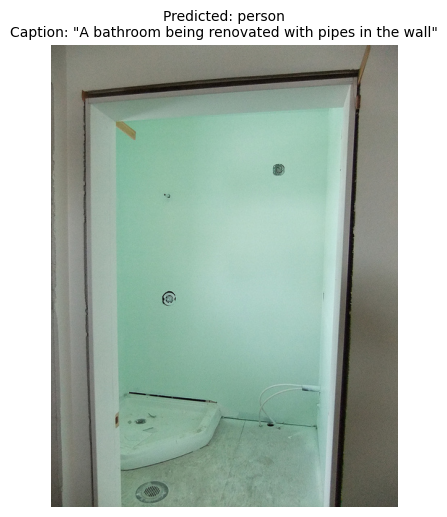

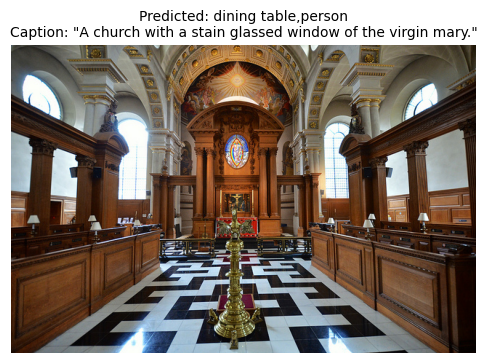

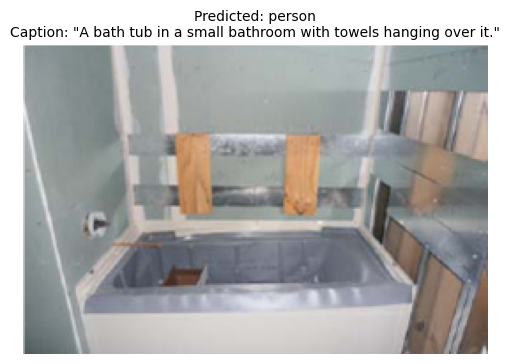

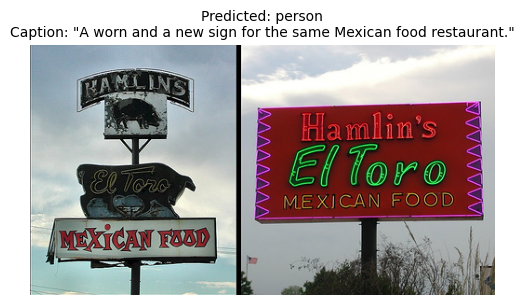

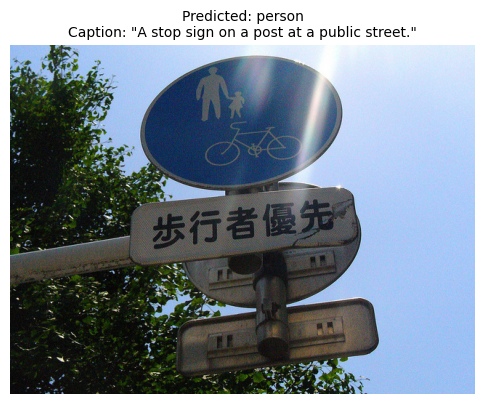

Saved predictions to unlabeled_with_multimodal_predictions.csv


In [ ]:

CSV_UNLABELED = "df_unlabeled.csv"
df = pd.read_csv(CSV_UNLABELED)

image_feature_cols = [col for col in df.columns if col.startswith("img_feat_")]
caption_feature_cols = [col for col in df.columns if col.startswith("cap_feat_")]
X_unlabeled = df_unlabeled[image_feature_cols + caption_feature_cols].values
model = tf.keras.models.load_model(MODEL_SAVE_PATH_MULTIMODAL)

predicted_probs = model.predict(X_unlabeled)
predicted_binary = (predicted_probs > 0.5).astype(int)
predicted_labels = mlb.inverse_transform(predicted_binary)  # Convert to human-readable label names
df_unlabeled['predicted_labels'] = [",".join(labels) if labels else "NO_LABEL_PREDICTED" for labels in predicted_labels]

# first 5 unique images with multimodal model
for img_path in df_unlabeled['image_path'].unique()[:5]:
    row = df_unlabeled[df_unlabeled['image_path'] == img_path].iloc[0]
    caption = row['caption_text']
    labels = row['predicted_labels']
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(f"Predicted: {labels}\nCaption: \"{caption}\"", fontsize=10)
    plt.axis("off")
    plt.show()

df_unlabeled.to_csv("unlabeled_with_multimodal_predictions.csv", index=False)
print("Saved predictions to unlabeled_with_multimodal_predictions.csv")

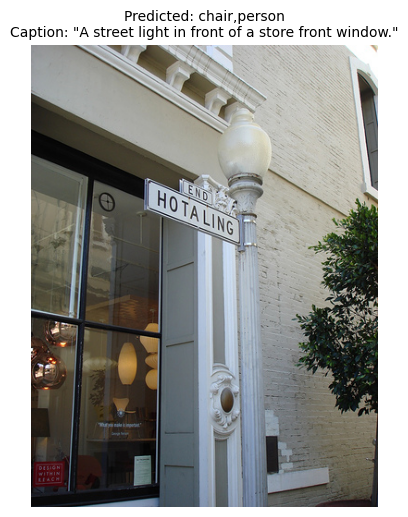

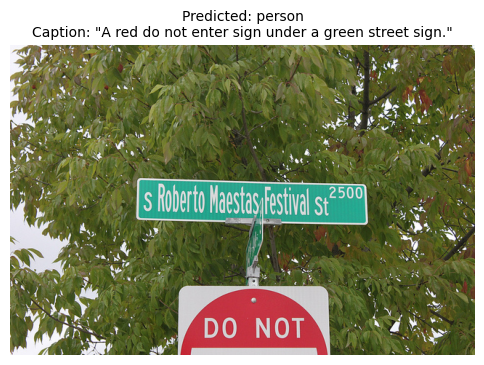

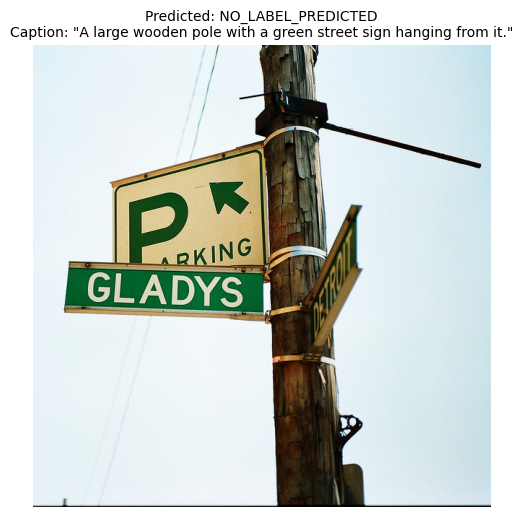

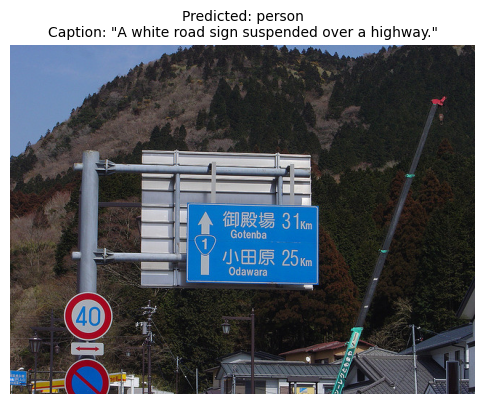

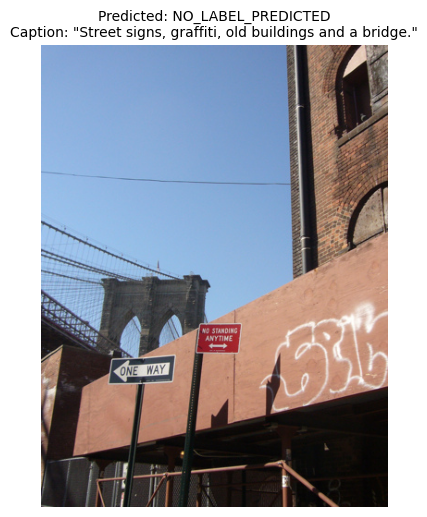

...

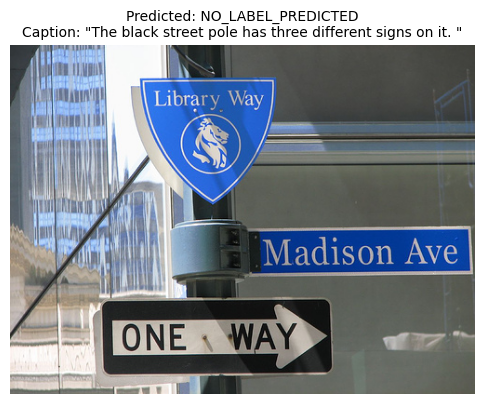

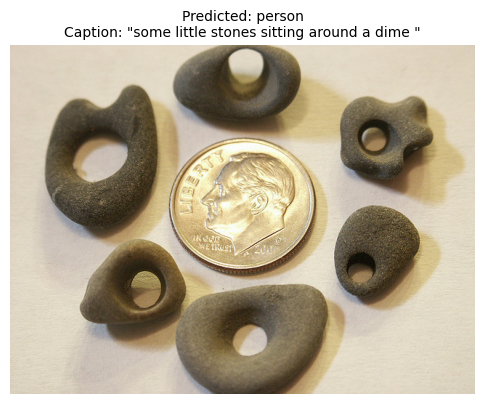

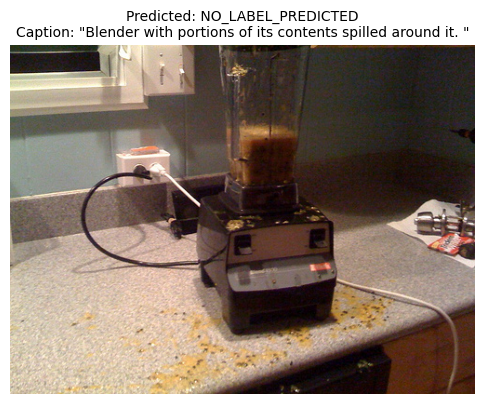

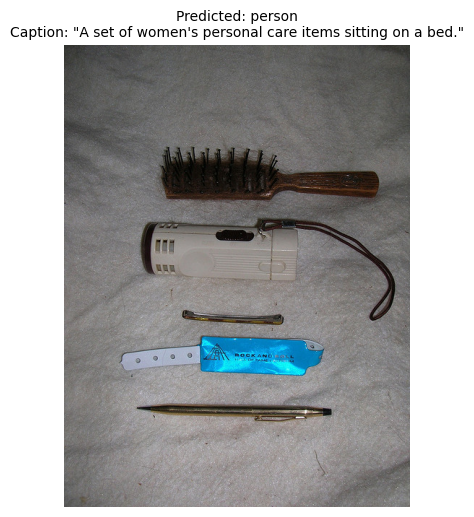

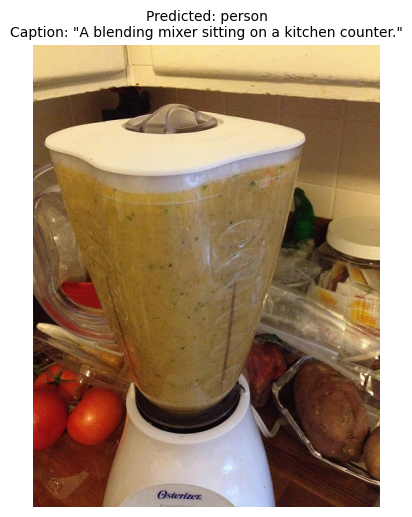

In [ ]:
for img_path in df_unlabeled['image_path'].unique()[20:]:
    row = df_unlabeled[df_unlabeled['image_path'] == img_path].iloc[0]
    caption = row['caption_text']
    labels = row['predicted_labels']
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(f"Predicted: {labels}\nCaption: \"{caption}\"", fontsize=10)
    plt.axis("off")
    plt.show()


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


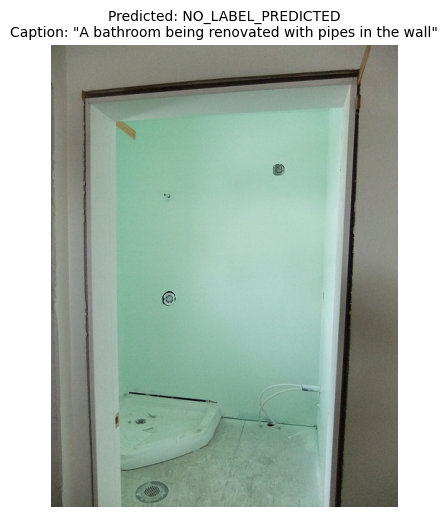

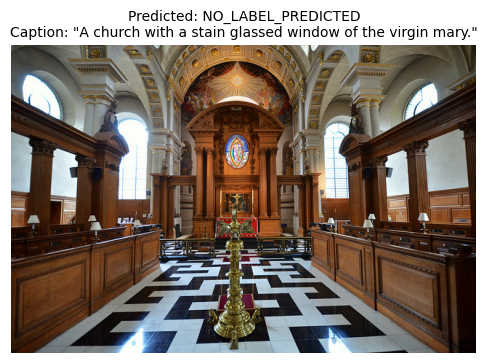

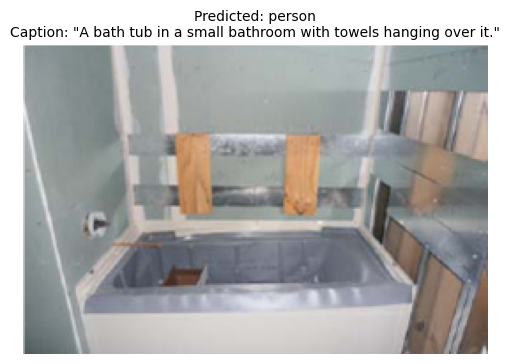

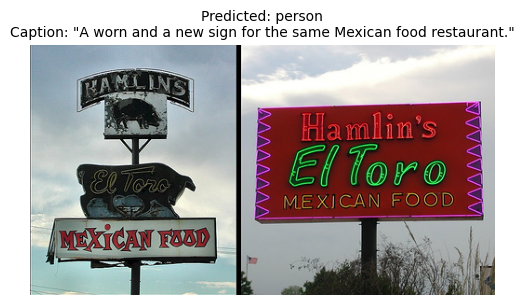

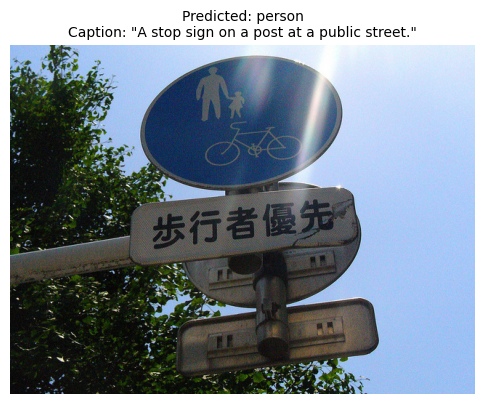

Saved predictions to unlabeled_with_image_predictions.csv


In [ ]:
#first 5 unique images with image only model

image_feature_cols = [col for col in df.columns if col.startswith("img_feat_")]
#caption_feature_cols = [col for col in df.columns if col.startswith("cap_feat_")]
X_unlabeled = df_unlabeled[image_feature_cols ].values
model = tf.keras.models.load_model(MODEL_SAVE_PATH_IMAGE_ONLY)

predicted_probs = model.predict(X_unlabeled)
predicted_binary = (predicted_probs > 0.5).astype(int)
predicted_labels = mlb.inverse_transform(predicted_binary)  # Convert to human-readable label names
df_unlabeled['predicted_labels'] = [",".join(labels) if labels else "NO_LABEL_PREDICTED" for labels in predicted_labels]

for img_path in df_unlabeled['image_path'].unique()[:5]:
    row = df_unlabeled[df_unlabeled['image_path'] == img_path].iloc[0]
    caption = row['caption_text']
    labels = row['predicted_labels']
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(f"Predicted: {labels}\nCaption: \"{caption}\"", fontsize=10)
    plt.axis("off")
    plt.show()

df_unlabeled.to_csv("unlabeled_with_image_predictions.csv", index=False)
print("Saved predictions to unlabeled_with_image_predictions.csv")

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


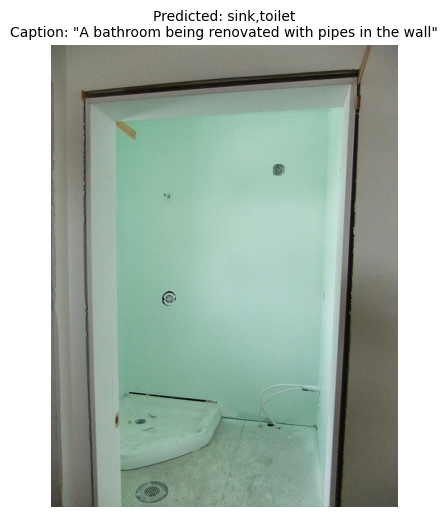

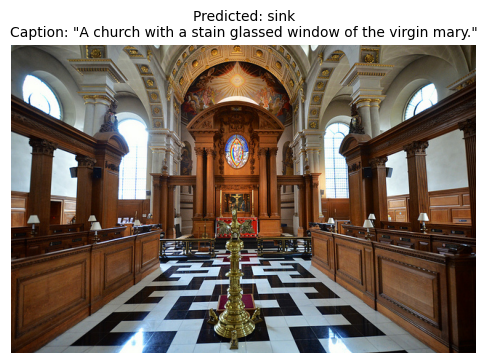

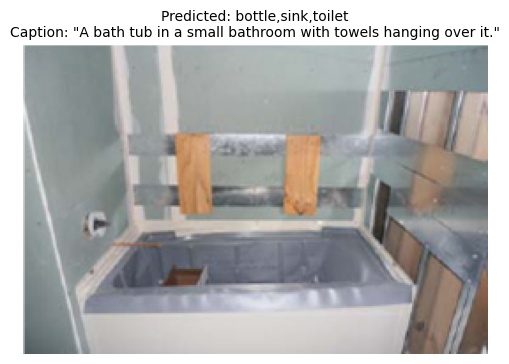

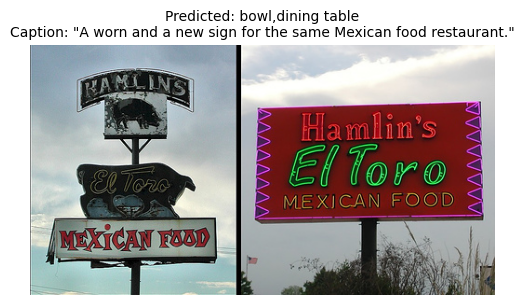

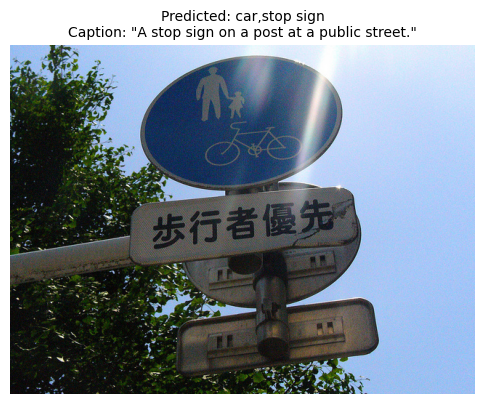

Saved predictions to unlabeled_with_captions_predictions.csv


In [ ]:

#first 5 unique images with caption only model

caption_feature_cols = [col for col in df.columns if col.startswith("cap_feat_")]
X_unlabeled = df_unlabeled[caption_feature_cols ].values
model = tf.keras.models.load_model(MODEL_SAVE_PATH_CAPTION_ONLY)

predicted_probs = model.predict(X_unlabeled)
predicted_binary = (predicted_probs > 0.5).astype(int)
predicted_labels = mlb.inverse_transform(predicted_binary)  # Convert to human-readable label names
df_unlabeled['predicted_labels'] = [",".join(labels) if labels else "NO_LABEL_PREDICTED" for labels in predicted_labels]

# --- Show first 5 unique images ---
for img_path in df_unlabeled['image_path'].unique()[:5]:
    row = df_unlabeled[df_unlabeled['image_path'] == img_path].iloc[0]
    caption = row['caption_text']
    labels = row['predicted_labels']
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(f"Predicted: {labels}\nCaption: \"{caption}\"", fontsize=10)
    plt.axis("off")
    plt.show()

df_unlabeled.to_csv("unlabeled_with_captions_predictions.csv", index=False)
print("Saved predictions to unlabeled_with_captions_predictions.csv")

### Elementwise Addition with zero padding (Only multimodal model and results)

In [ ]:
processed_fused_data = []
fused_feature_dim = CANNY_FEATURE_DIM

for img_path, text_caps in coco_data_dict.items():
    img_feat = image_features.get(img_path) # Shape (4096,)
    feat_caps = caption_features.get(img_path) # List of (300,) vectors
    labels_set = image_path_to_labels.get(img_path)
    all_labels_str = ",".join(sorted(list(labels_set))) if labels_set else ""
    for text_caption, caption_feat_vector in zip(text_caps, feat_caps):
        # Create a zero-padded array for the caption feature
        padded_caption_feat = np.zeros(CANNY_FEATURE_DIM)
        # Place the original caption_feat_vector at the beginning of the padded array
        padded_caption_feat[:WORD2VEC_FEATURE_DIM] = caption_feat_vector
        # Now padded_caption_feat has shape (4096,) with zeros filling the extra dimensions
        # Element-wise addition for multimodal fusion
        fused_features = img_feat + padded_caption_feat # Shape (4096,)
        row = [img_path, text_caption] + \
              img_feat.tolist() + \
              caption_feat_vector.tolist() + \
              fused_features.tolist() + \
              [all_labels_str]
        processed_fused_data.append(row)

print(f"Generated {len(processed_fused_data)} rows.")

# Update column names to include original image, original caption, and fused features
img_feat_cols = [f'img_feat_{i+1}' for i in range(CANNY_FEATURE_DIM)]
cap_feat_cols = [f'cap_feat_{i+1}' for i in range(WORD2VEC_FEATURE_DIM)]
fused_feat_cols = [f'fused_feat_{i+1}' for i in range(fused_feature_dim)] # New columns for fused features

column_names = ['image_path', 'caption_text'] + \
               img_feat_cols + \
               cap_feat_cols + \
               fused_feat_cols + \
               ['all_labels']

df = pd.DataFrame(processed_fused_data, columns=column_names)
df.to_csv("coco_multilabel_dataset_word2vec_canny_fused_and_separate.csv", index=False)
print(f"Saved the dataset to coco_multilabel_dataset_word2vec_canny_fused_and_separate.csv")

Generated 25014 rows.
Saved the dataset to coco_multilabel_dataset_word2vec_canny_fused_and_separate.csv


In [ ]:

CANNY_FEATURE_DIM = 64 * 64
CSV_PATH_FUSED = "coco_multilabel_dataset_word2vec_canny_fused_and_separate.csv" # Updated path
MODEL_SAVE_PATH_MULTIMODAL = "multimodal_classifier_canny_word2vec_fused.h5"

fused_feature_cols_read = [f'fused_feat_{i+1}' for i in range(CANNY_FEATURE_DIM)] # For multimodal model

df_full_fused = pd.read_csv(CSV_PATH_FUSED) # Load the fused data
df_full_fused['all_labels'] = df_full_fused['all_labels'].fillna('')

df_labeled_fused = df_full_fused[df_full_fused['all_labels'] != ''].copy()
df_unlabeled_fused = df_full_fused[df_full_fused['all_labels'] == ''].copy()
df_unlabeled_fused.to_csv("df_unlabeled_fused_and_separate.csv", index=False)
print(f"Found {len(df_labeled_fused)} labeled samples for training/testing (fused).")
print(f"Found {len(df_unlabeled_fused)} unlabeled samples to predict on later (fused).")

# RE-SPLIT THE LABELED FUSED DATAFRAME
df_train_fused = df_labeled_fused[df_labeled_fused['image_path'].isin(train_paths)]
df_val_fused = df_labeled_fused[df_labeled_fused['image_path'].isin(val_paths)]
df_test_fused = df_labeled_fused[df_labeled_fused['image_path'].isin(test_paths)]

# Multimodal Model (Image + Caption Fused)
X_train_multimodal_fused = df_train_fused[fused_feature_cols_read].values
X_val_multimodal_fused = df_val_fused[fused_feature_cols_read].values
X_test_multimodal_fused = df_test_fused[fused_feature_cols_read].values
input_dim_multimodal_fused = X_train_multimodal_fused.shape[1]

multimodal_fused_model, _ = build_and_train_model(
    X_train_multimodal_fused, y_train, # y_train is assumed to be correct based on train_paths
    X_val_multimodal_fused, y_val,   # y_val is assumed to be correct based on val_paths
    input_dim_multimodal_fused, "Multimodal (Canny + Word2Vec Fused)"
)
multimodal_fused_accuracy = evaluate_and_report(
    multimodal_fused_model, X_test_multimodal_fused, y_test, mlb.classes_,
    "Multimodal (Canny + Word2Vec Fused)", MODEL_SAVE_PATH_MULTIMODAL
)


Found 24774 labeled samples for training/testing (fused).
Found 240 unlabeled samples to predict on later (fused).

 Building and Training Multimodal (Canny + Word2Vec Fused) Model


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_15 (Dense)                │ (None, 2048)           │     8,390,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 80)             │        20,560 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,180,880 (42.65 MB)

 Trainable params: 11,173,200 (42.62 MB)

 Non-trainable params: 7,680 (30.00 KB)

Epoch 1/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 114s 221ms/step - auc: 0.5155 - binary_accuracy: 0.5133 - loss: 0.8928 - precision: 0.0385 - recall: 0.5155 - val_auc: 0.4920 - val_binary_accuracy: 0.5649 - val_loss: 0.6904 - val_precision: 0.0357 - val_recall: 0.3932
Epoch 2/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - auc: 0.5477 - binary_accuracy: 0.5590 - loss: 0.7751 - precision: 0.0426 - recall: 0.5176 - val_auc: 0.5026 - val_binary_accuracy: 0.7323 - val_loss: 0.5833 - val_precision: 0.0411 - val_recall: 0.2639
Epoch 3/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - auc: 0.5495 - binary_accuracy: 0.6810 - loss: 0.6147 - precision: 0.0498 - recall: 0.4289 - val_auc: 0.5148 - val_binary_accuracy: 0.9421 - val_loss: 0.4328 - val_precision: 0.1771 - val_recall: 0.1354
Epoch 4/30
272/272 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - auc: 0.5475 - binary_accuracy: 0.8583 - loss: 0.4269 - precision: 0.0767 - recall: 0.2619 - val_auc: 0.5212 - val_binary_accuracy: 0.9624 - val_loss: 0.2906 - val_precision: 


Classification Report:
                 precision    recall  f1-score   support

      airplane       1.00      0.11      0.19        95
         apple       0.00      0.00      0.00        75
      backpack       0.00      0.00      0.00       235
        banana       0.00      0.00      0.00       125
  baseball bat       0.00      0.00      0.00        85
baseball glove       0.00      0.00      0.00        95
          bear       0.00      0.00      0.00        35
           bed       0.00      0.00      0.00       150
         bench       0.00      0.00      0.00       210
       bicycle       0.00      0.00      0.00       120
          bird       0.00      0.00      0.00        90
          boat       0.00      0.00      0.00       115
          book       0.00      0.00      0.00       255
        bottle       0.00      0.00      0.00       390
          bowl       0.00      0.00      0.00       315
      broccoli       0.00      0.00      0.00        50
           bus       0

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step
Saved all model predictions to unlabeled_with_all_multimodal_model_predictions.csv

--- Multimodal Model Predictions on Unlabeled Data ---


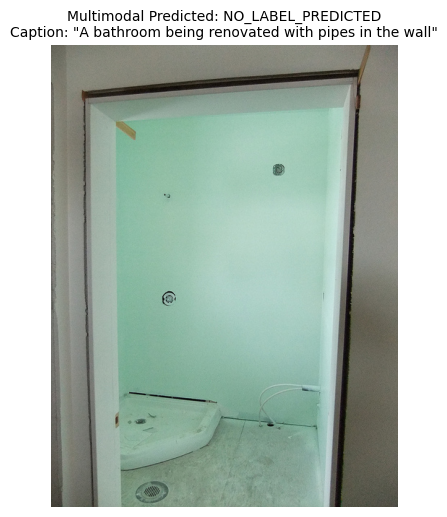

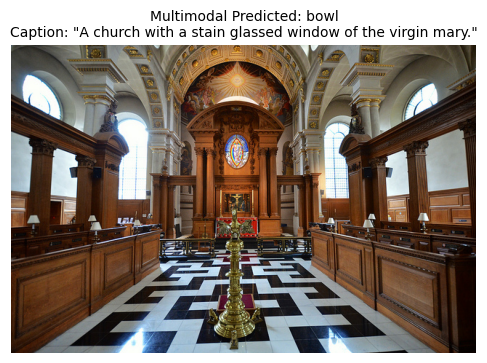

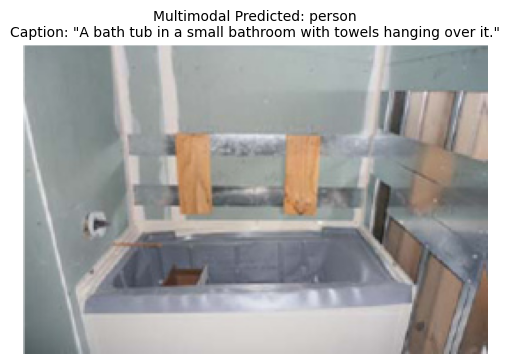

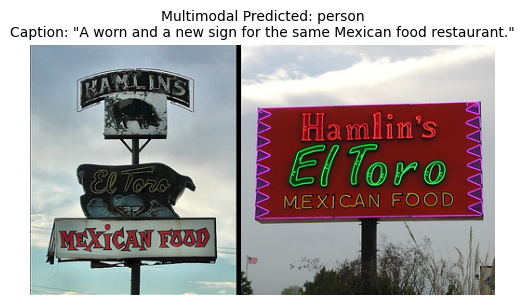

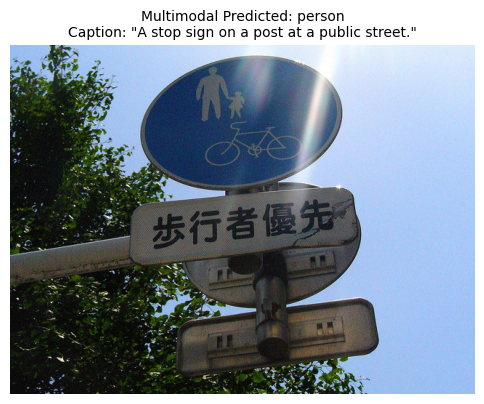

In [ ]:
CSV_UNLABELED = "df_unlabeled_fused_and_separate.csv"
df_unlabeled_predictions = pd.read_csv(CSV_UNLABELED)

# Multimodal Model Predictions
X_unlabeled_multimodal_fused = df_unlabeled_fused[fused_feature_cols_read].values # Use df_unlabeled_fused
model_multimodal_pred = tf.keras.models.load_model(MODEL_SAVE_PATH_MULTIMODAL)
predicted_probs_multimodal = model_multimodal_pred.predict(X_unlabeled_multimodal_fused)

predicted_binary_multimodal = (predicted_probs_multimodal > 0.5).astype(int)
predicted_labels_multimodal = mlb.inverse_transform(predicted_binary_multimodal)
df_unlabeled_predictions['predicted_labels_multimodal'] = [",".join(labels) if labels else "NO_LABEL_PREDICTED" for labels in predicted_labels_multimodal]

# Save all predictions to a single CSV
df_unlabeled_predictions.to_csv("unlabeled_with_all_multimodal_model_predictions.csv", index=False)
print("Saved all model predictions to unlabeled_with_all_multimodal_model_predictions.csv")

# Multimodal Model Predictions Visualization
print("\n--- Multimodal Model Predictions on Unlabeled Data ---")
for img_path in df_unlabeled_predictions['image_path'].unique()[:5]:
    row = df_unlabeled_predictions[df_unlabeled_predictions['image_path'] == img_path].iloc[0]
    caption = row['caption_text']
    labels = row['predicted_labels_multimodal']
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(f"Multimodal Predicted: {labels}\nCaption: \"{caption}\"", fontsize=10)
    plt.axis("off")
    plt.show()


### Elementwise Multiplcation

### Late Fusion